In [2]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

from matplotlib import pyplot as plt
import numpy as np

import os

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: l

In [3]:
zalando_data_dir = "/kaggle/input/women-clothes/clothes"

In [4]:
train_images = tf.keras.utils.image_dataset_from_directory(
    zalando_data_dir, label_mode=None, image_size=(256, 256), batch_size=32
)

Found 16240 files belonging to 1 classes.


height 256
width 256


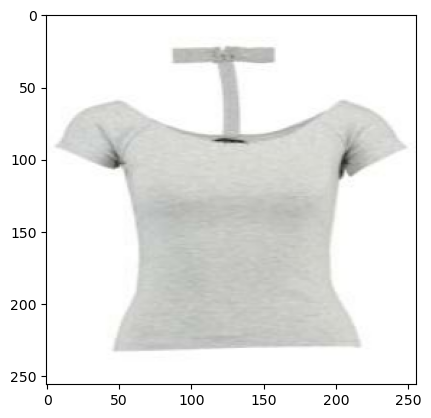

In [5]:
image_batch = next(iter(train_images))
random_index = np.random.choice(image_batch.shape[0])
random_image = image_batch[random_index].numpy().astype("int32")
plt.axis("on")
plt.imshow(random_image)
print("height", len(random_image))
print("width", len(random_image[0]))
plt.show()

In [6]:
# Normalize the images to [-1, 1] which is the range of the tanh activation
train_images = train_images.map(lambda x: (x - 127.5) / 127.5)

In [7]:
# latent dimension of the random noise
LATENT_DIM = 100
# weight initializer for G per DCGAN paper
WEIGHT_INIT = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# number of channels, 1 for gray scale and 3 for color images
CHANNELS = 3 # UPDATED from 1

input_size =512

In [8]:
def build_generator():
     # Create a Keras Sequential model
    model = Sequential(name='generator')

    # Prepare for reshape: FC => BN => ReLU layers, note: input shape defined in the 1st Dense layer
    model.add(layers.Dense((input_size // 16) * (input_size // 16) * 512, input_dim=LATENT_DIM))
    model.add(layers.ReLU())

    # 1D => 4D: reshape the output of the previous layer to a 4D tensor
    model.add(layers.Reshape((input_size // 16, input_size // 16, 512)))

    # Upsample to 128x128: apply a transposed CONV => BN => ReLU
    model.add(layers.Conv2DTranspose(256, (4, 4), strides=(2, 2), padding="same", kernel_initializer='glorot_normal'))
    model.add(layers.ReLU())

    # Upsample to 256x256: apply a transposed CONV => BN => ReLU
    model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same", kernel_initializer='glorot_normal'))
    model.add(layers.ReLU())

    # Upsample to 512x512: apply a transposed CONV => BN => ReLU
    model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same", kernel_initializer='glorot_normal'))
    model.add(layers.ReLU())

    # Final layer: Conv2D with tanh activation to generate the output image
    model.add(layers.Conv2D(CHANNELS, (3, 3), padding="same", activation="tanh"))

    # Return the generator model
    return model

In [9]:
# build the generator model
generator = build_generator()

In [10]:
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 524288)            52953088  
                                                                 
 re_lu (ReLU)                (None, 524288)            0         
                                                                 
 reshape (Reshape)           (None, 32, 32, 512)       0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 64, 64, 256)      2097408   
 nspose)                                                         
                                                                 
 re_lu_1 (ReLU)              (None, 64, 64, 256)       0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 128, 128, 128)    524416    
 ranspose)                                               

In [11]:
def build_discriminator(height, width, depth, alpha=0.2):
    # create a Keras Sequential model
    model = Sequential(name='discriminator')
    input_shape = (height, width, depth)

    # 1. first set of CONV => BN => leaky ReLU layers
    model.add(layers.Conv2D(64, (4, 4), padding="same", strides=(2, 2),
        input_shape=input_shape))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=alpha))

    # 2. second set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4), padding="same", strides=(2, 2)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=alpha))

    # 3. third set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4), padding="same", strides=(2, 2)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=alpha))

    # flatten and apply dropout
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.3))

    # sigmoid in the last layer outputting a single value for binary classification
    model.add(layers.Dense(1, activation="sigmoid"))

    # return the discriminator model
    return model

In [12]:
# build the discriminator model
discriminator = build_discriminator(256, 256, 3)

In [13]:
discriminator.summary()

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      3136      
                                                                 
 batch_normalization (BatchN  (None, 128, 128, 64)     256       
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 128, 128, 64)      0         
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 128)       131200    
                                                                 
 batch_normalization_1 (Batc  (None, 64, 64, 128)      512       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 64, 64, 128)     

In [14]:
class DCGAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super().__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):

        batch_size = tf.shape(real_images)[0]
        noise = tf.random.normal(shape=(batch_size, self.latent_dim))

        # Step 1. Train the discriminator with both real images (label as 1) and fake images (classified as label as 0)
        with tf.GradientTape() as tape:
            # Compute discriminator loss on real images
            pred_real = self.discriminator(real_images, training=True)
            real_labels = tf.ones((batch_size, 1))
            # UPDATED: apply one-sided label smoothing to real labels
            real_labels += 0.05 * tf.random.uniform(tf.shape(real_labels))
            d_loss_real = self.loss_fn(real_labels, pred_real)

            # Compute discriminator loss on fake images
            fake_images = self.generator(noise)
            pred_fake = self.discriminator(fake_images, training=True)
            fake_labels = tf.zeros((batch_size, 1))
            # UPDATED: add random noise to fake labels - not needed
            # fake_labels += 0.05 * tf.random.uniform(tf.shape(fake_labels))
            d_loss_fake = self.loss_fn(fake_labels, pred_fake)

            # total discriminator loss
            d_loss = (d_loss_real + d_loss_fake)/2
        # Compute discriminator gradients
        grads = tape.gradient(d_loss, self.discriminator.trainable_variables)
        # Update discriminator weights
        self.d_optimizer.apply_gradients(zip(grads, self.discriminator.trainable_variables))

        # Step 2. Train the generator (do not update weights of the discriminator)
        misleading_labels = tf.ones((batch_size, 1)) # G wants D to think the fake images are real (label as 1)

        with tf.GradientTape() as tape:
            fake_images = self.generator(noise, training=True)
            pred_fake = self.discriminator(fake_images, training=True)
            g_loss = self.loss_fn(misleading_labels, pred_fake)
        # Compute generator gradients
        grads = tape.gradient(g_loss, self.generator.trainable_variables)
        # Update generator wieghts
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_variables))

        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {"d_loss": self.d_loss_metric.result(), "g_loss": self.g_loss_metric.result()}

In [16]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=64, latent_dim=100):
        self.num_img = num_img
        self.latent_dim = latent_dim

        # Create random noise seed for visualization during traing
        self.seed = tf.random.normal([64, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.generator(self.seed)
        generated_images = (generated_images * 127.5) + 127.5
        generated_images.numpy()

        fig = plt.figure(figsize=(8,8))
        for i in range(self.num_img):
            plt.subplot(8, 8, i+1)
            img = keras.utils.array_to_img(generated_images[i])
            plt.title(len(generated_images[i]))
            plt.imshow(img)
            plt.axis('off')
        plt.savefig('epoch_{:03d}.png'.format(epoch))
        plt.show()

    def on_train_end(self, logs=None):
        self.model.generator.save('generator.h5')

In [17]:
dcgan = DCGAN(discriminator=discriminator, generator=generator, latent_dim=LATENT_DIM)

In [18]:
D_LR = 0.0001# UPDATED: discriminator learning rate
G_LR = 0.0001 # UPDATED: generator learning rate

dcgan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=D_LR, beta_1 = 0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=G_LR, beta_1 = 0.5),
    loss_fn=keras.losses.BinaryCrossentropy(),
)

Epoch 1/100
508/508 [==============================] - ETA: 0s - d_loss: -4.6896 - g_loss: 86.2897

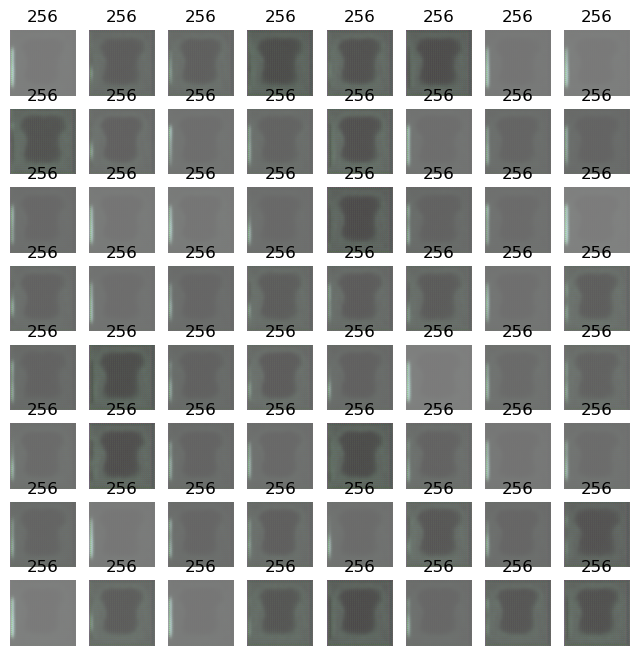

508/508 [==============================] - 208s 408ms/step - d_loss: -4.6896 - g_loss: 86.2897
Epoch 2/100
508/508 [==============================] - ETA: 0s - d_loss: -12.2376 - g_loss: 64.9676

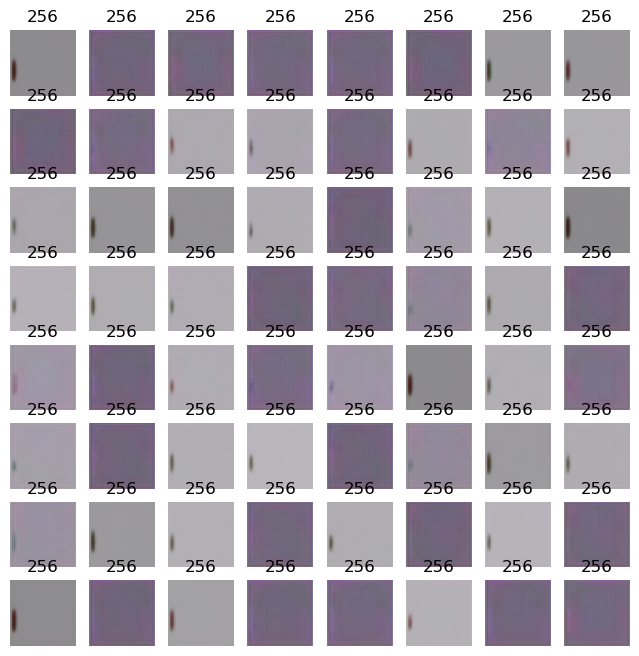

508/508 [==============================] - 209s 410ms/step - d_loss: -12.2376 - g_loss: 64.9676
Epoch 3/100
508/508 [==============================] - ETA: 0s - d_loss: -25.4241 - g_loss: 90.0453

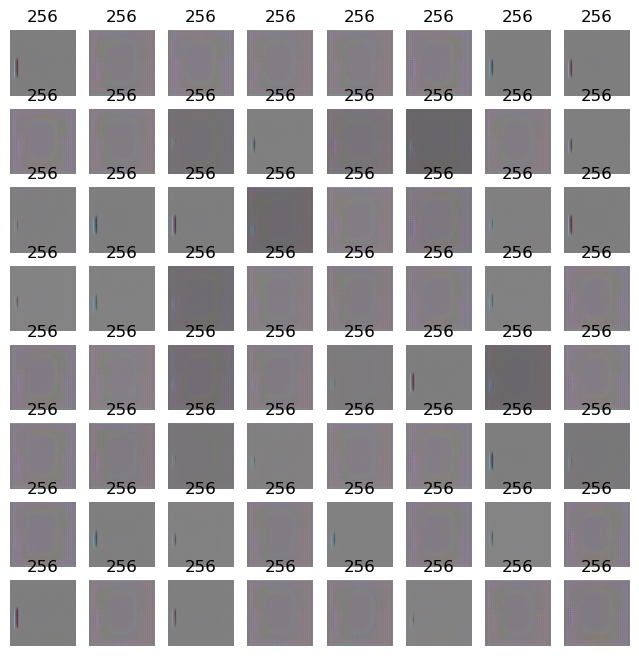

508/508 [==============================] - 208s 409ms/step - d_loss: -25.4241 - g_loss: 90.0453
Epoch 4/100
508/508 [==============================] - ETA: 0s - d_loss: -45.0192 - g_loss: 105.7295

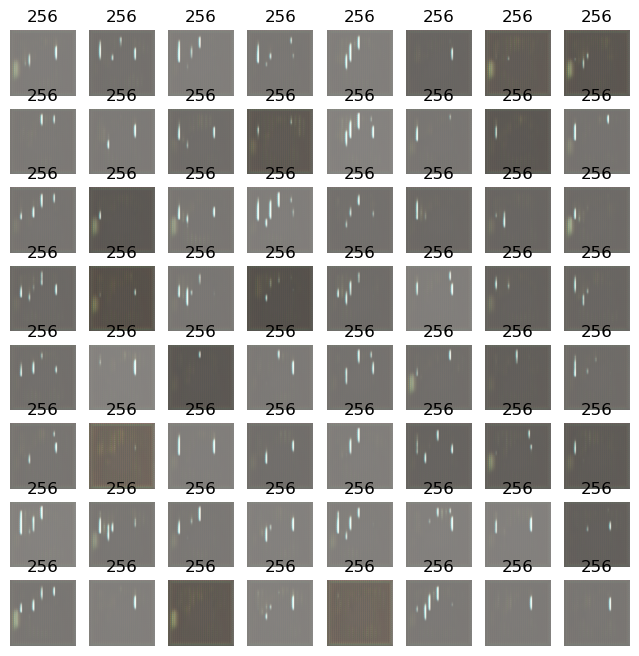

508/508 [==============================] - 208s 409ms/step - d_loss: -45.0192 - g_loss: 105.7295
Epoch 5/100
508/508 [==============================] - ETA: 0s - d_loss: -69.0781 - g_loss: 160.4660

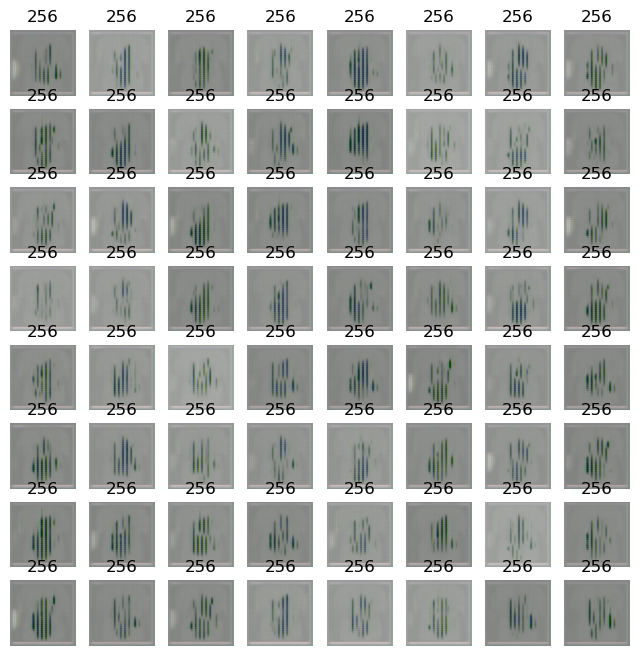

508/508 [==============================] - 209s 410ms/step - d_loss: -69.0781 - g_loss: 160.4660
Epoch 6/100
508/508 [==============================] - ETA: 0s - d_loss: -2.0835 - g_loss: 104.5840

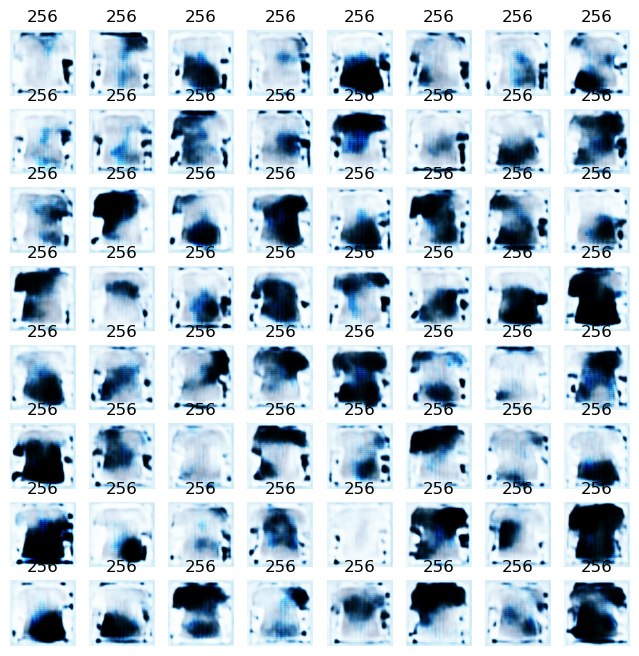

508/508 [==============================] - 208s 408ms/step - d_loss: -2.0835 - g_loss: 104.5840
Epoch 7/100
508/508 [==============================] - ETA: 0s - d_loss: 4.2274 - g_loss: 23.3599

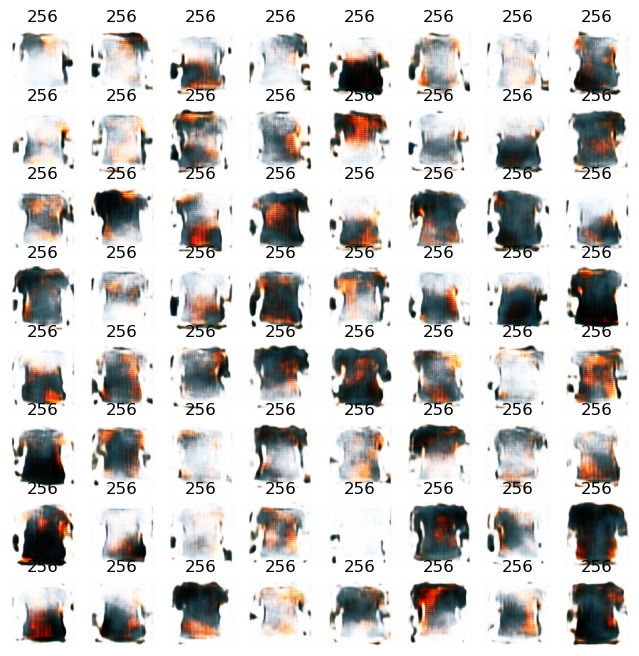

508/508 [==============================] - 209s 410ms/step - d_loss: 4.2274 - g_loss: 23.3599
Epoch 8/100
508/508 [==============================] - ETA: 0s - d_loss: 2.9000 - g_loss: 15.9412

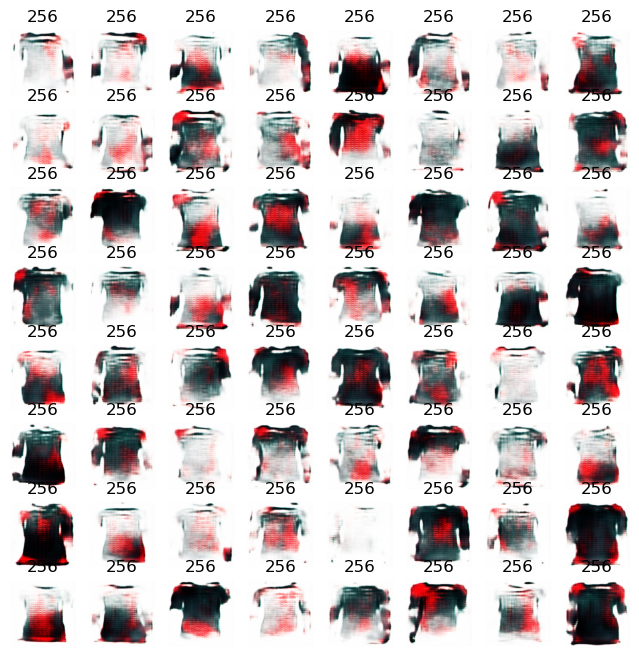

508/508 [==============================] - 208s 409ms/step - d_loss: 2.9000 - g_loss: 15.9412
Epoch 9/100
508/508 [==============================] - ETA: 0s - d_loss: 3.0275 - g_loss: 15.8843

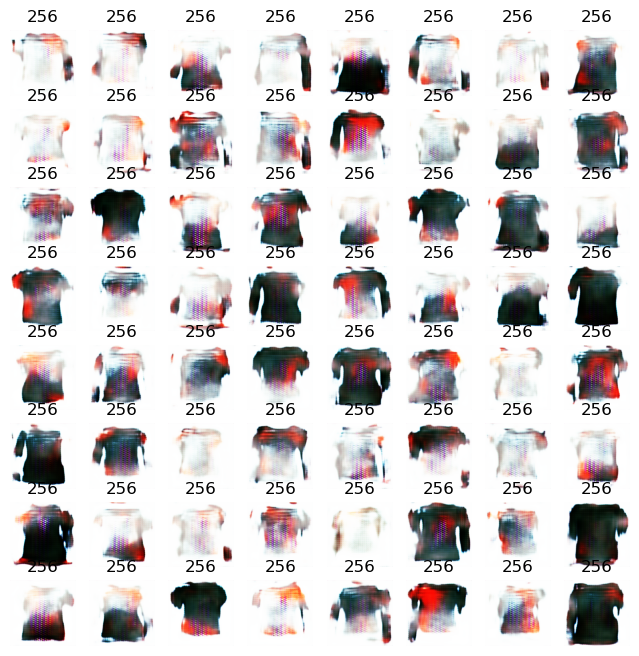

508/508 [==============================] - 208s 408ms/step - d_loss: 3.0275 - g_loss: 15.8843
Epoch 10/100
508/508 [==============================] - ETA: 0s - d_loss: 3.4948 - g_loss: 15.5065

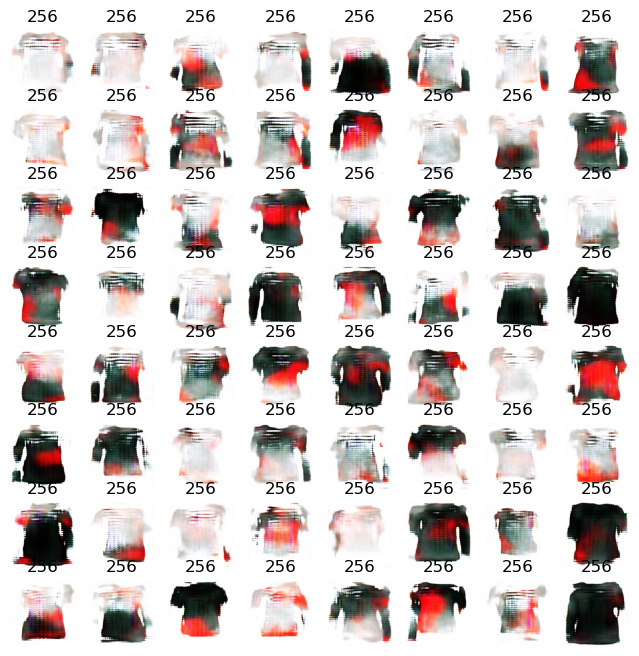

508/508 [==============================] - 209s 410ms/step - d_loss: 3.4948 - g_loss: 15.5065
Epoch 11/100
508/508 [==============================] - ETA: 0s - d_loss: 4.0130 - g_loss: 12.7978

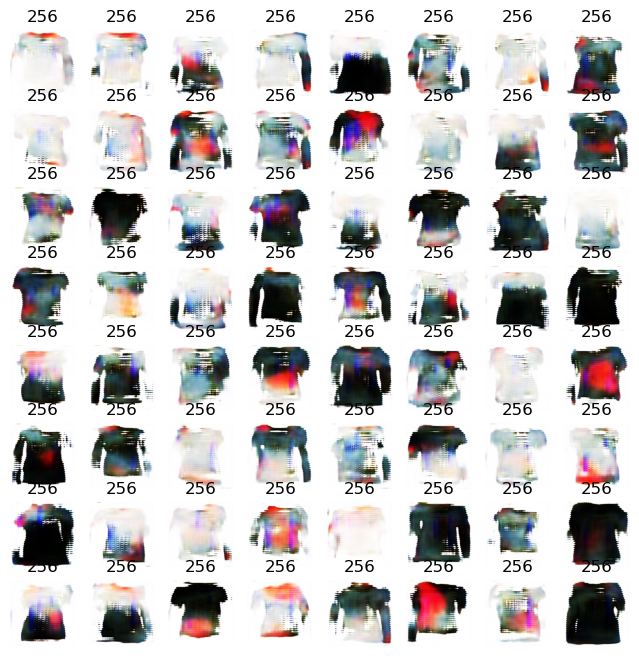

508/508 [==============================] - 209s 410ms/step - d_loss: 4.0130 - g_loss: 12.7978
Epoch 12/100
508/508 [==============================] - ETA: 0s - d_loss: 4.0073 - g_loss: 10.8450

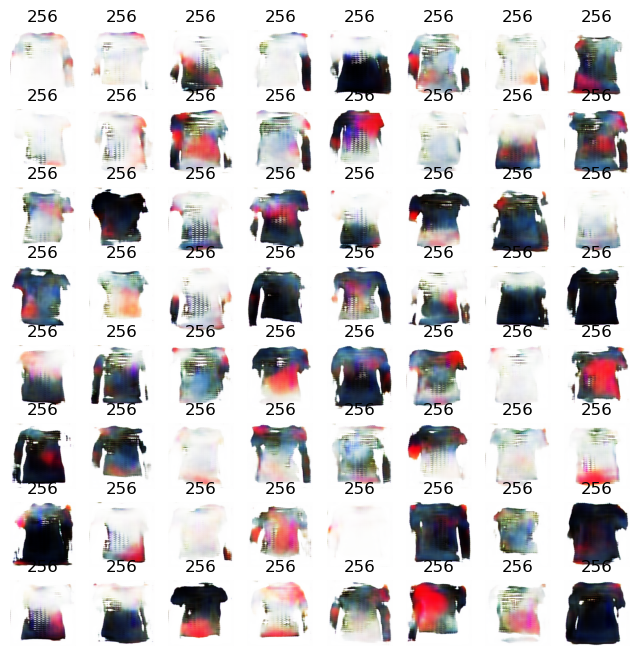

508/508 [==============================] - 209s 411ms/step - d_loss: 4.0073 - g_loss: 10.8450
Epoch 13/100
508/508 [==============================] - ETA: 0s - d_loss: 4.1388 - g_loss: 9.5847

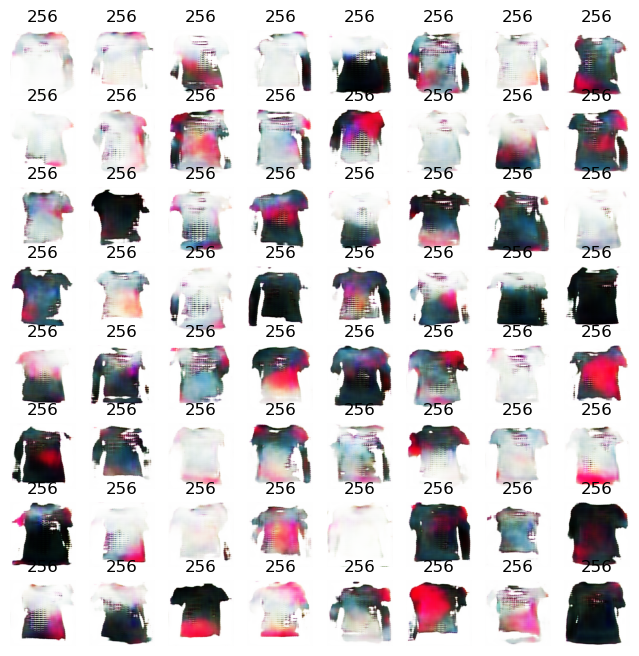

508/508 [==============================] - 208s 409ms/step - d_loss: 4.1388 - g_loss: 9.5847
Epoch 14/100
508/508 [==============================] - ETA: 0s - d_loss: 3.9579 - g_loss: 9.3963

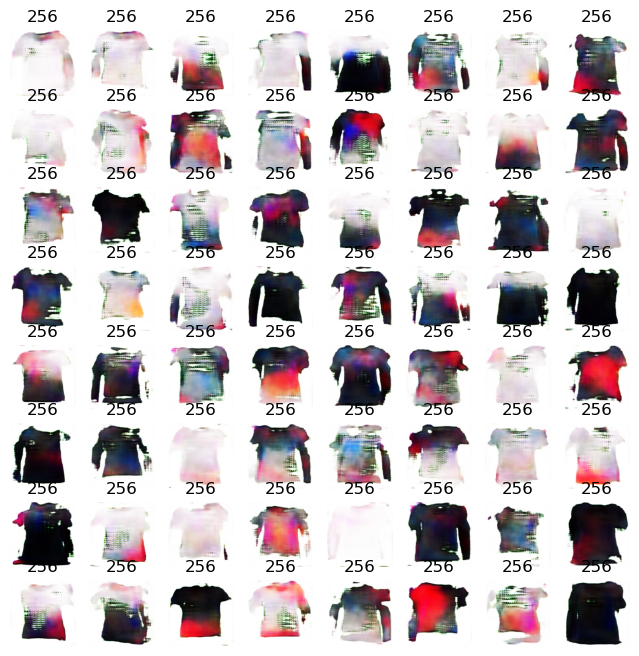

508/508 [==============================] - 208s 409ms/step - d_loss: 3.9579 - g_loss: 9.3963
Epoch 15/100
508/508 [==============================] - ETA: 0s - d_loss: 4.0589 - g_loss: 8.8506

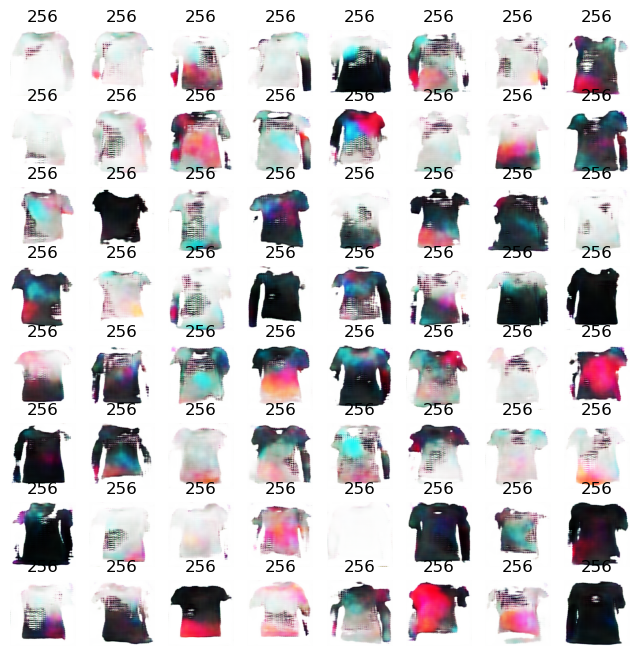

508/508 [==============================] - 208s 409ms/step - d_loss: 4.0589 - g_loss: 8.8506
Epoch 16/100
508/508 [==============================] - ETA: 0s - d_loss: 4.1966 - g_loss: 8.3098

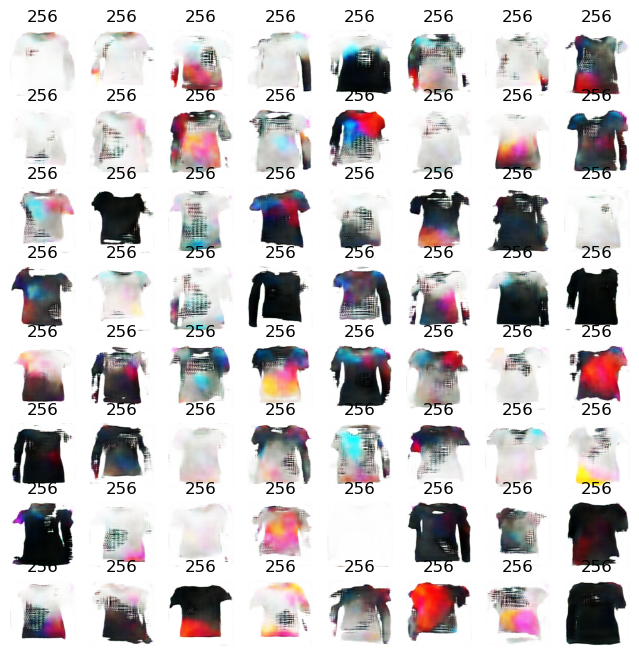

508/508 [==============================] - 208s 409ms/step - d_loss: 4.1966 - g_loss: 8.3098
Epoch 17/100
508/508 [==============================] - ETA: 0s - d_loss: 4.1367 - g_loss: 7.7875

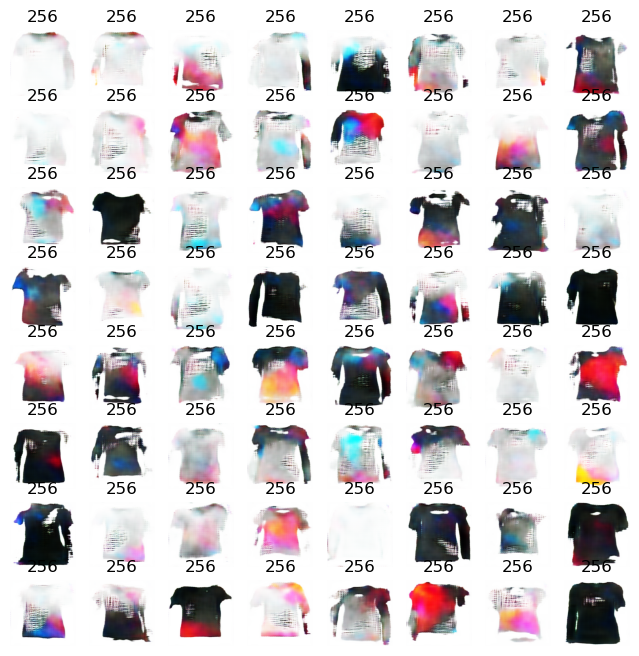

508/508 [==============================] - 208s 408ms/step - d_loss: 4.1367 - g_loss: 7.7875
Epoch 18/100
508/508 [==============================] - ETA: 0s - d_loss: 4.1284 - g_loss: 7.5852

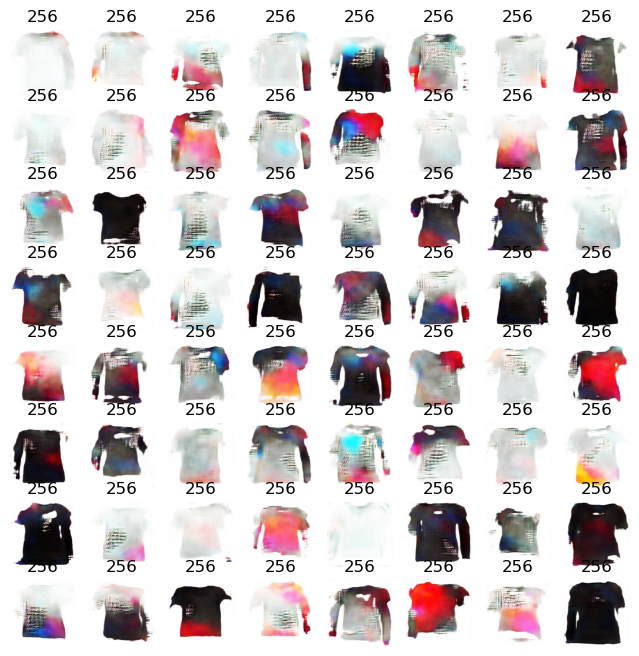

508/508 [==============================] - 208s 410ms/step - d_loss: 4.1284 - g_loss: 7.5852
Epoch 19/100
508/508 [==============================] - ETA: 0s - d_loss: 4.0011 - g_loss: 7.3854

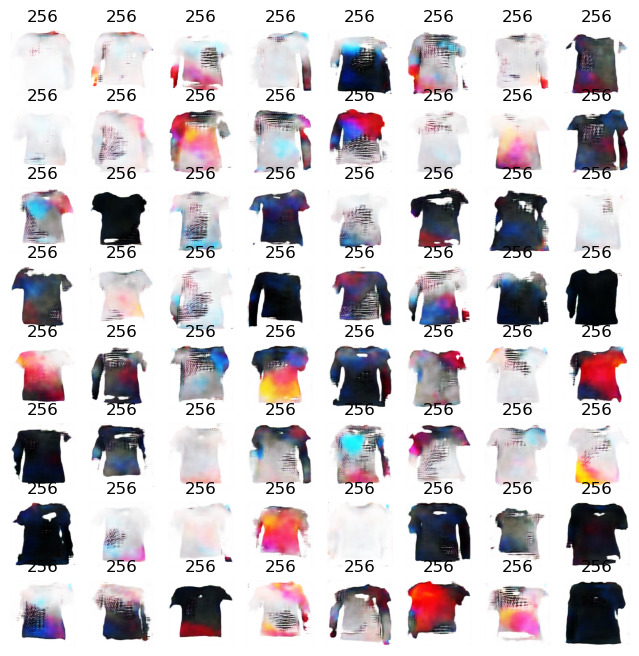

508/508 [==============================] - 208s 409ms/step - d_loss: 4.0011 - g_loss: 7.3854
Epoch 20/100
508/508 [==============================] - ETA: 0s - d_loss: 4.1205 - g_loss: 7.1651

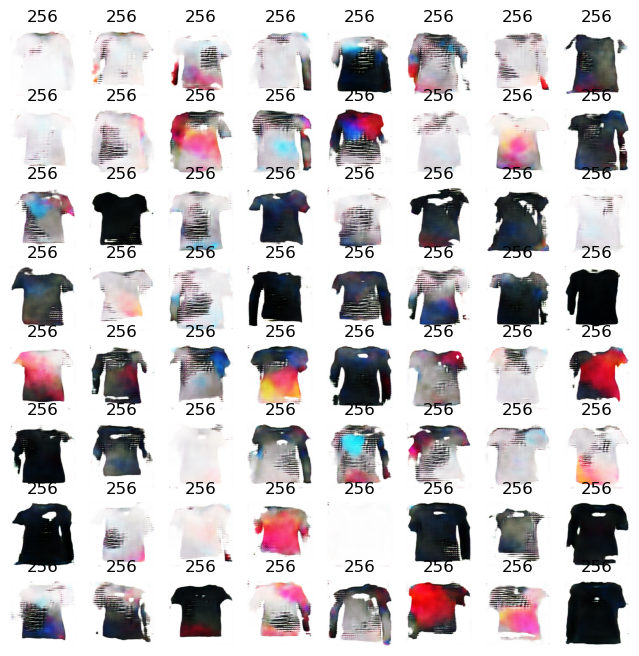

508/508 [==============================] - 208s 409ms/step - d_loss: 4.1205 - g_loss: 7.1651
Epoch 21/100
508/508 [==============================] - ETA: 0s - d_loss: 4.0711 - g_loss: 7.2752

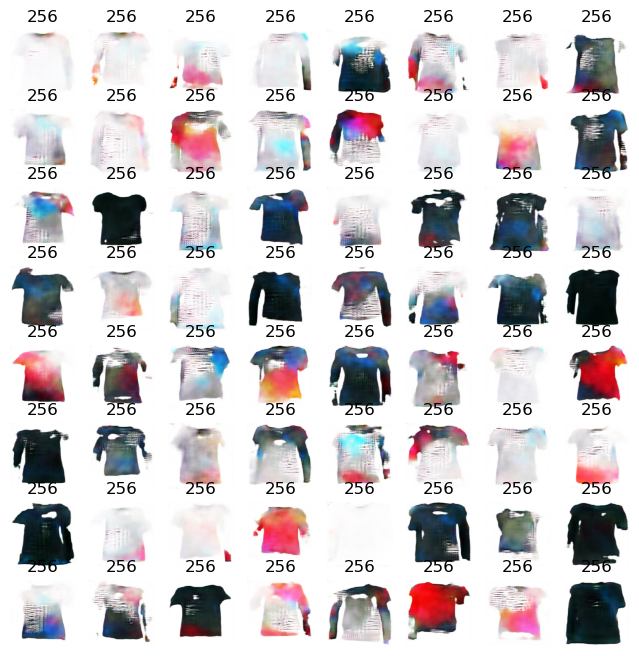

508/508 [==============================] - 208s 408ms/step - d_loss: 4.0711 - g_loss: 7.2752
Epoch 22/100
508/508 [==============================] - ETA: 0s - d_loss: 4.0011 - g_loss: 7.0416

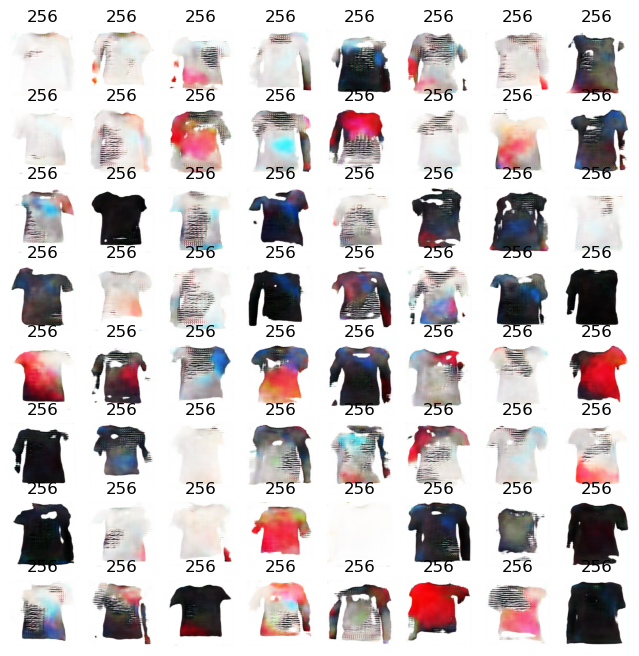

508/508 [==============================] - 208s 408ms/step - d_loss: 4.0011 - g_loss: 7.0416
Epoch 23/100
508/508 [==============================] - ETA: 0s - d_loss: 4.1298 - g_loss: 6.6207

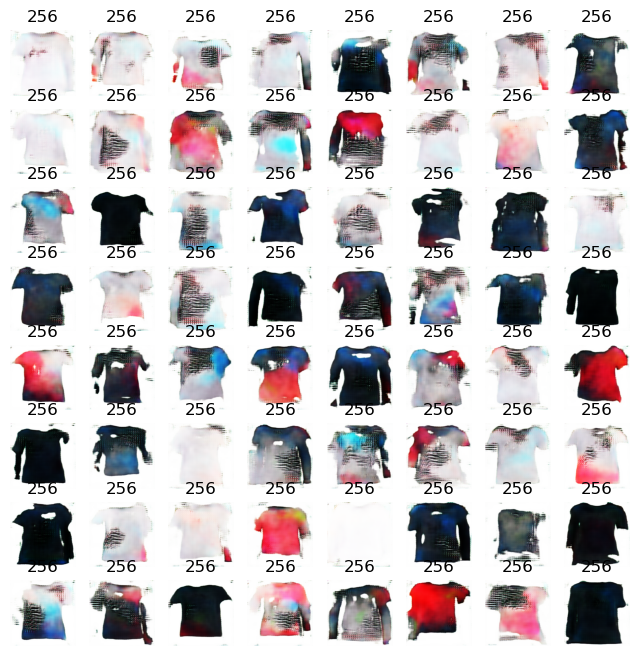

508/508 [==============================] - 209s 410ms/step - d_loss: 4.1298 - g_loss: 6.6207
Epoch 24/100
508/508 [==============================] - ETA: 0s - d_loss: 3.9467 - g_loss: 6.7717

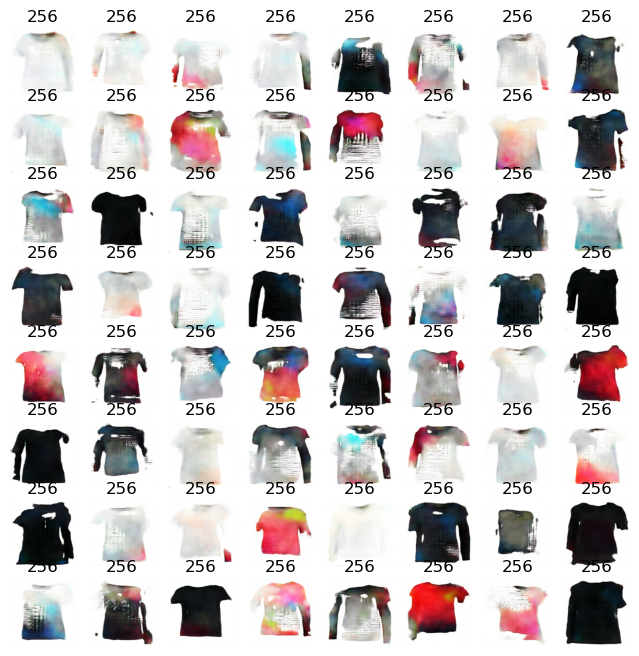

508/508 [==============================] - 208s 409ms/step - d_loss: 3.9467 - g_loss: 6.7717
Epoch 25/100
272/508 [===============>..............] - ETA: 1:33 - d_loss: 3.9540 - g_loss: 6.2228

In [ ]:
NUM_EPOCHS = 100 # number of epochs
dcgan.fit(train_images, epochs=NUM_EPOCHS, 
callbacks=[GANMonitor(num_img=64, latent_dim=LATENT_DIM), keras.callbacks.ModelCheckpoint(filepath='model.{epoch:03d}.h5', save_weights_only=True)])